# Monte Carlo Dispersion for Valetudo Mission

Here we go through a dispersion analysis of the rocket trajectory. The Monte Carlo dispersion analysis takes several input parameters and their standard deviation to calculate and plot the ellipses of impact and apogee of the rocket flight.

This jupyter notebook presents the Monte Carlo analysis performed for the flight of Valetudo, one of the most famous rockets made by Projeto Jupiter. Valetudo is an 80mm diameter and 2.4m height rocket built for the first time to be launched at Latin American Space Challenge 2019. Indeed, Valetudo became to be launched in 2019 on August 10th by 5:56 pm (local time), impulsed by a class K motor called 'Keron', a solid motor completely design and built by Projeto Jupiter. The rocket crossed the sky and reached an 872m apogee (target apogee was 1km), descending safely by the drogue parachute called "Charmander" and landing with an 18.5 m/s descending speed. 

We hope you enjoy the flight(s) in this notebook just like everyone in LASC19 enjoyed it in real-time!

## Import required libraries

In [138]:
from rocketpy import Environment, SolidMotor, Rocket, Flight, Function
from numpy.random import normal, uniform, choice
from datetime import datetime

In [139]:
import plotly.graph_objects as go   # This library is a new in rocketpy analysis!
import plotly.express as px         # This library is a new in rocketpy analysis!

import glob
import numpy as np
import IPython

## Defining Analysis Parameters

Here we define the details of the rocket (propulsion, aerodynamics, recovery and electronic systems informations), such as the launch and environment. The "analysis_parameters" is a dictionary and each item in this dictionary is defined as a tuple or a list. Basically, when the parameter is associated to a tuple, the first tuple member is the mean and the second is the standard deviation of this parameter. For example:

"rocketMass": (mean, standard deviation)

Obs.: All parameters are given in the International system of units.

In [141]:
analysis_parameters = {
    # Mass Details
    "rocketMass": (8.257, 0.001),   # Must do not includ prpellant mass
    
    # Propulsion Details
    "impulse": (1415.15, 35.3),
    "burnOut": (5.274, 1),
    "nozzleRadius": (21.642/1000, 0.5/1000),
    "throatRadius": (8/1000, 0.5/1000),
    "grainSeparation": (6/1000, 1/1000),
    "grainDensity": (1707, 50),
    "grainOuterRadius": (21.4/1000, 0.375/1000),
    "grainInitialInnerRadius": (9.65/1000, 0.375/1000),
    "grainInitialHeight": (120/1000, 1/1000),

    # Aerodynamic Details
    "inertiaI": (3.675, 0.03675),
    "inertiaZ": (0.007, 0.00007),
    "radius": (40.45/1000,0.001),
    "distanceRocketNozzle": (-1.024,0.001),
    "distanceRocketPropellant": (-0.571,0.001),
    "powerOffDrag": (1, 0.033),
    "powerOnDrag": (1, 0.033),
    "noseLength": (0.274, 0.001),
    "noseDistanceToCM": (1.134, 0.001),
    "finSpan": (0.077, 0.0005),
    "finRootChord": (0.058, 0.0005),
    "finTipChord": (0.018, 0.0005),
    "finDistanceToCM": (-0.906, 0.001),

    # Launch and Environment Details
    "windDirection":(0, 2),
    "windSpeed":(1, 0.033),
    "inclination": (84.7, 1),
    "heading": (53, 2),
    "railLength": (5.7 , 0.0005),
    
    # Parachute Details
    "CdSDrogue": (0.349*1.3, 0.07),
    "lag_rec": (1 , 0.5),
    
    # Electronic Systems Details
    "lag_se": (0.73, 0.16)}     
    

You probably noted that some parameters have mean equals to 1. It means that or parameter will be multiplied by a gaussian distribution centered in 1.

## Creating a Flight Settings Generator

Then, we create multiple flight settings based on the details defined in analysis parameters

In [142]:
def flight_settings(analysis_parameters, total_number):
    i = 0
    while i < total_number:
        # Generate a flight setting
        flight_setting = {}
        for parameter_key, parameter_value in analysis_parameters.items():
            if type(parameter_value) is tuple:
                flight_setting[parameter_key] =  normal(*parameter_value)
            else:
                flight_setting[parameter_key] =  choice(parameter_value)
        # Update counter
        i += 1
        # Yield a flight setting
        yield flight_setting

## Creating a Export Function

Now we need to create a function for writing all simulations results that we are interested.

A better practice is openning the files in "append" mode, this way we can acumulate our simulations. But if you want to start with a clean file, just change "a" for "w" (write)

In [143]:
filename = 'Monte_carlo_valetudo'

dispersion_error_file = open(str(filename)+'.valetudo_disp_error.txt', 'a')
dispersion_input_file = open(str(filename)+'.valetudo_disp_in.txt', 'a')
dispersion_output_file = open(str(filename)+'.valetudo_disp_out.txt', 'a')

def export_flight_data(flight_setting, flight_data):
    # Generate flight results
    flight_result = {"outOfRailTime": flight_data.outOfRailTime,
                 "outOfRailVelocity": flight_data.outOfRailVelocity,
                        "apogeeTime": flight_data.apogeeTime,
                    "apogeeAltitude": flight_data.apogee - Env.elevation,
                           "apogeeX": flight_data.apogeeX,
                           "apogeeY": flight_data.apogeeY,
                        "impactTime": flight_data.tFinal,
                           "impactX": flight_data.xImpact,
                           "impactY": flight_data.yImpact,
                    "impactVelocity": flight_data.impactVelocity,
               "initialStaticMargin": flight_data.rocket.staticMargin(0),
             "outOfRailStaticMargin": flight_data.rocket.staticMargin(TestFlight.outOfRailTime),
                 "finalStaticMargin": flight_data.rocket.staticMargin(TestFlight.rocket.motor.burnOutTime),
                    "numberOfEvents": len(flight_data.parachuteEvents)}
    
    # Calculate maximum reached velocity
    sol = np.array(flight_data.solution)
    flight_data.vx = Function(sol[:, [0, 4]], 'Time (s)', 'Vx (m/s)', 'linear', extrapolation="natural")
    flight_data.vy = Function(sol[:, [0, 5]], 'Time (s)', 'Vy (m/s)', 'linear', extrapolation="natural")
    flight_data.vz = Function(sol[:, [0, 6]], 'Time (s)', 'Vz (m/s)', 'linear', extrapolation="natural")
    flight_data.v = (flight_data.vx**2 + flight_data.vy**2 + flight_data.vz**2)**0.5
    flight_data.maxVel = np.amax(flight_data.v.source[:, 1])
    flight_result['maxVelocity'] = flight_data.maxVel
    
    # Take care of parachute results
    if len(flight_data.parachuteEvents) > 0:
        flight_result['drogueTriggerTime'] = flight_data.parachuteEvents[0][0]
        flight_result['drogueInflatedTime'] = flight_data.parachuteEvents[0][0] + flight_data.parachuteEvents[0][1].lag
        flight_result['drogueInflatedVelocity'] = flight_data.v(flight_data.parachuteEvents[0][0] + flight_data.parachuteEvents[0][1].lag)
    else:
        flight_result['drogueTriggerTime'] = 0
        flight_result['drogueInflatedTime'] = 0
        flight_result['drogueInflatedVelocity'] = 0
    
    # Write flight setting and results to file
    dispersion_input_file.write(str(flight_setting) + '\n')
    dispersion_output_file.write(str(flight_result) + '\n')

def export_flight_error(flight_setting):
    dispersion_output_file.write(str(flight_setting) + '\n')

## Simulating Each Flight Setting

Now , we will run throught each flight setting , creating the environment , rocket and motor classes with the data of analysis parameters .
For the power off and on drag and thrust curve user should have in hands the .csv (or .eng for comercial motor's thrust curve).

We are using a simplified drogue trigger in this notebook, but Projeto Jupiter has developed a software (SisRec.py) that works as parachute trigger in real rocket flight, and could be imported here. Once SisRec is a non open-source software, we will not use it here.

In [ ]:
# Initialize counter and timer
i = 0
initial_time = datetime.now()

# Set Environment
Env = Environment(railLength=5.7,     
                  gravity = 9.8,
                  date=(2019, 8, 10, 21),    
                  latitude = -23.363611, 
                  longitude = -48.011389,
                  elevation=668)

Env.maxExpectedHeight = 1500

Env.setAtmosphericModel(type='Ensemble',
                        file='../../data/weather/LASC2019_TATUI_reanalysis_ensemble.nc',
                        dictionary="ECMWF")

# Pick randomly onde Ensemble member. See Environmen clas usage notebook for detailed information about Ensemble members.
Env.selectEnsembleMember(choice(list(range(10))))

# Set up parachutes

def drogueTrigger(p, y):
    # p = pressure
    # y = [x, y, z, vx, vy, vz, e0, e1, e2, e3, w1, w2, w3]
    # activate drogue when vz < 0 m/s.
    return True if y[5] < 0 else False

# Iterate over flight settings
out = display(IPython.display.Pretty('Starting'), display_id=True)

# Here we stated our simulations. The second argument fo the flight_settings function is the number of iterations to perform
for setting in flight_settings(analysis_parameters, 12000):
    # Print current iteration
    i += 1
    out.update(IPython.display.Pretty("Curent iteration: " + str(i) + " | Average Time per Iteration: {:2.6f} s".format((datetime.now() - initial_time).seconds/i)))
    # print("Curent iteration: ", i)
          
    # Modify environment
    Env.railLength = setting['railLength']
    Env.windDirection += setting['windDirection']
    Env.windSpeed *= setting['windSpeed']

    # Create motor
    Keron =  SolidMotor(thrustSource='../../data/keron/thrustCurve.csv',
                   burnOut=5.274,
                   reshapeThrustCurve=(setting['burnOut'], setting['impulse']),
                   nozzleRadius=setting['nozzleRadius'],
                   throatRadius=setting['throatRadius'],
                   grainNumber=6,
                   grainSeparation=setting['grainSeparation'],
                   grainDensity=setting['grainDensity'],
                   grainOuterRadius=setting['grainOuterRadius'],
                   grainInitialInnerRadius=setting['grainInitialInnerRadius'],
                   grainInitialHeight=setting['grainInitialHeight'],
                   interpolationMethod='linear')
    
    # Create rocket
    Valetudo = Rocket(motor=Keron,
                      radius=setting['radius'],
                      mass=setting['rocketMass'],
                      inertiaI=setting['inertiaI'],
                      inertiaZ=setting['inertiaZ'],
                      distanceRocketNozzle=setting['distanceRocketNozzle'],
                      distanceRocketPropellant=setting['distanceRocketPropellant'],
                      powerOffDrag='../../data/valetudo/cd_openRocket.csv',
                      powerOnDrag='../../data/valetudo/cd_openRocket.csv')
    
    # Edit rocket drag
    Valetudo.powerOffDrag *= setting["powerOffDrag"]
    Valetudo.powerOnDrag *= setting["powerOnDrag"]

    # Add rocket nose, fins and tail
    NoseCone = Valetudo.addNose(length=setting['noseLength'], kind='vonKarman', distanceToCM=setting['noseDistanceToCM'])
    FinSet = Valetudo.addFins(n=3, rootChord=setting['finRootChord'], tipChord=setting['finTipChord'], span=setting['finSpan'], distanceToCM=setting['finDistanceToCM'])
    
    Posição_CM_descarregado = 1.4125
    Valetudo.setRailButtons([0.224, -0.93], 30)

    # Add parachute
    Drogue = Valetudo.addParachute('Drogue',
                                    CdS=setting['CdSDrogue'],
                                    trigger=drogueTrigger, 
                                    samplingRate=105,
                                    lag=setting['lag_rec'] + setting['lag_se'],
                                    noise=(0, 8.3, 0.5))

    try:
        TestFlight = Flight(rocket=Valetudo, environment=Env, inclination=setting['inclination'], heading=setting['heading'], maxTime=600)
        export_flight_data(setting, TestFlight)
    except Exception as E:
        print(E)
        export_flight_error(flight_setting)
    
    # Converts windSpeen to the original condition (important)
    Env.windSpeed /= setting['windSpeed']

## Closing Input and Output Files

We need to close the files before working with them

In [144]:
dispersion_input_file.close()
dispersion_output_file.close()

## Importing Dispersion Analysis Saved Data

Then, let's store the results in variables and get all dispertion results by reading and converting to dict all lines of the dispertion output file - and finally storing the general results and the results by type

In [145]:
filename = 'Monte_carlo_valetudo'    # The filename shall be identical to the previous filename given

# Initialize variable to store all results
dispersion_general_results = []

dispersion_results = {"outOfRailTime": [],
                  "outOfRailVelocity": [],
                         "apogeeTime": [],
                     "apogeeAltitude": [],
                            "apogeeX": [],
                            "apogeeY": [],
                         "impactTime": [],
                            "impactX": [],
                            "impactY": [],
                     "impactVelocity": [],
                "initialStaticMargin": [],
              "outOfRailStaticMargin": [],
                  "finalStaticMargin": [],
                     "numberOfEvents": [],
                        "maxVelocity": [],
                  "drogueTriggerTime": [],
                 "drogueInflatedTime": [],
             "drogueInflatedVelocity": []}

# Get all dispersion results
for filename in glob.iglob(str(filename)+'.valetudo_disp_out.txt'):
    # Get file
    dispersion_output_file = open(filename, 'r+')
    
    # Read each line of the file and convert to dict
    for line in dispersion_output_file:
        if line[0] == '{':
            flight_result = eval(line)

            # Store general result
            # if flight_result['apogeeAltitude']  > 650:
            dispersion_general_results.append(flight_result)
            # Store result by type
            for parameter_key, parameter_value in flight_result.items():
                dispersion_results[parameter_key].append(parameter_value)

# Close data file
dispersion_output_file.close()

# Creating end of file
# dispersion_output_file.write ("Name Mean Value | Standard Deviation" + '\n')

# Print number of flights simulated
N = len(dispersion_general_results)
print('Number of simulations: ', N)

Number of simulations:  12000


## Dispersion Results

Finally, let's go to the simulations results!

### Out of Rail Time

In [146]:
print('Out of Rail Time - Mean Value: {:.5f} s'.format(np.mean(dispersion_results["outOfRailTime"])))
print('Out of Rail Time - Standard Deviation: {:.5f} s'.format(np.std(dispersion_results["outOfRailTime"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["outOfRailTime"],
                    title='Out of Rail Time',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout(
    xaxis_title_text='Time (s)', 
    yaxis_title_text='Number of occurences')

fig1.show()   # You can comment this line in case you do not want to see the graphics

Out of Rail Time - Mean Value: 1.08586 s
Out of Rail Time - Standard Deviation: 0.18244 s


### Out of Rail Velocity

In [147]:
print('Out of Rail Velocity - Mean Value: {:.5f} m/s'.format(np.mean(dispersion_results["outOfRailVelocity"])))
print('Out of Rail Velocity - Standard Deviation: {:.5f} m/s'.format(np.std(dispersion_results["outOfRailVelocity"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["outOfRailVelocity"],
                    title='Out of Rail Velocity',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout(
    xaxis_title_text='Velocity (m/s)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Out of Rail Velocity - Mean Value: 23.03633 m/s
Out of Rail Velocity - Standard Deviation: 3.02689 m/s


### Apogee Time

In [148]:
print('Apogee Time - Mean Value: {:.5f} s'.format(np.mean(dispersion_results["apogeeTime"])))
print('Apogee Time - Standard Deviation: {:.5f} s'.format(np.std(dispersion_results["apogeeTime"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["apogeeTime"],
                    title='Apogee Time',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='Time (s)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Apogee Time - Mean Value: 14.64827 s
Apogee Time - Standard Deviation: 0.33944 s


### Apogee Altitude

In [149]:
print('Apogee Altitude - Mean Value: {:.5f} m'.format(np.mean(dispersion_results["apogeeAltitude"])))
print('Apogee Altitude - Standard Deviation: {:.5f} m'.format(np.std(dispersion_results["apogeeAltitude"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["apogeeAltitude"],
                    title='Apogee Altitude',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='Altitude (m)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Apogee Altitude - Mean Value: 882.02570 m
Apogee Altitude - Standard Deviation: 45.30461 m


### Apogee X Position

In [150]:
print('Apogee X Position - Mean Value: {:.5f} m'.format(np.mean(dispersion_results["apogeeX"])))
print('Apogee X Position - Standard Deviation: {:.5f} m'.format(np.std(dispersion_results["apogeeX"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["apogeeX"],
                    title='Apogee X Position',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='X Position (m)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Apogee X Position - Mean Value: 114.30327 m
Apogee X Position - Standard Deviation: 25.45403 m


### Apogee Y Position

In [151]:
print('Apogee Y Position - Mean Value: {:.5f} m'.format(np.mean(dispersion_results["apogeeY"])))
print('Apogee Y Position - Standard Deviation: {:.5f} m'.format(np.std(dispersion_results["apogeeY"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["apogeeY"],
                    title='Apogee Y Position',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='Y Position (m)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Apogee Y Position - Mean Value: 113.57668 m
Apogee Y Position - Standard Deviation: 20.38368 m


### Impact Time


In [152]:
print('Impact Time - Mean Value: {:.5f} s'.format(np.mean(dispersion_results["impactTime"])))
print('Impact Time - Standard Deviation: {:.5f} s'.format(np.std(dispersion_results["impactTime"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["impactTime"],
                    title='Impact Time',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='Time (s)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Impact Time - Mean Value: 63.82315 s
Impact Time - Standard Deviation: 4.48748 s


### Impact X Position

In [153]:
print('Impact X Position - Mean Value: {:.5f} m'.format(np.mean(dispersion_results["impactX"])))
print('Impact X Position - Standard Deviation: {:.5f} m'.format(np.std(dispersion_results["impactX"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["impactX"],
                    title='Impact X Position',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='X Position (m)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Impact X Position - Mean Value: 362.43297 m
Impact X Position - Standard Deviation: 45.34492 m


### Impact Y Position

In [154]:
print('Impact Y Position - Mean Value: {:.5f} m'.format(np.mean(dispersion_results["impactY"])))
print('Impact Y Position - Standard Deviation: {:.5f} m'.format(np.std(dispersion_results["impactY"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["impactY"],
                    title='Impact Y Position',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='Y Position (m)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Impact Y Position - Mean Value: 34.96149 m
Impact Y Position - Standard Deviation: 37.36692 m


### Mean and Standard Deviation Variation with Number of Simulations

In [155]:
mean = lambda x: np.mean(dispersion_results["impactX"][0:int(x)])
stdv = lambda x: np.std(dispersion_results["impactX"][0:int(x)])

X = []
Me = []
St = []
for i in range(N+1):
    X.append(i+1)
    Me.append(mean(i+1))
    St.append(stdv(i+1))

fig = go.Figure(data=go.Scatter(x=X, y=Me, name="mean"))

fig.update_layout(title='Impact X Position - East (m) x Number of Simulations',
                   xaxis_title='Number of Simulations',
                   yaxis_title='Impact X Position - East (m)', 
                   width=600, height=400)

#fig1 = go.Figure(data=go.Scatter(x=X, y=St))
#fig1.update_layout(title='Std. Deviation of the Impact X Position (m) x Number of Simulations',
#                   xaxis_title='Number of Simulations',
#                   yaxis_title='Std. Deviation of the Impact X Position (m)',
#                   width=600, height=400)

fig.add_trace(go.Scatter(x=X, y=St,  name='Std', line= dict(color='red', width=2)))

fig.show()
#fig1.show()

### Impact Velocity

In [156]:
print('Impact Velocity - Mean Value: {:.5f} m/s'.format(np.mean(dispersion_results["impactVelocity"])))
print('Impact Velocity - Standard Deviation: {:.5f} m/s'.format(np.std(dispersion_results["impactVelocity"])))

fig1 = px.histogram(x= dispersion_results["impactVelocity"],
                    title='Impact Velocity',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout(
    xaxis_title_text='Velocity (m/s)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Impact Velocity - Mean Value: -18.34914 m/s
Impact Velocity - Standard Deviation: 2.67965 m/s


### Static Margin

In [157]:
print('Initial Static Margin - Mean Value: {:.5f}'.format(np.mean(dispersion_results["initialStaticMargin"])))
print('Initial Static Margin - Standard Deviation: {:.5f}\n'.format(np.std(dispersion_results["initialStaticMargin"])))
print('Out of Rail Static Margin - Mean Value: {:.5f}'.format(np.mean(dispersion_results["outOfRailStaticMargin"])))
print('Out of Rail Static Margin - Standard Deviation: {:.5f}\n'.format(np.std(dispersion_results["outOfRailStaticMargin"])))
print('Final Static Margin - Mean Value: {:.5f}'.format(np.mean(dispersion_results["finalStaticMargin"])))
print('Final Static Margin - Standard Deviation: {:.5f}'.format(np.std(dispersion_results["finalStaticMargin"])))

fig1 = go.Figure()

fig1.add_trace(go.Histogram(x= dispersion_results["initialStaticMargin"], name="Initial"))
fig1.add_trace(go.Histogram(x= dispersion_results["outOfRailStaticMargin"], name="Out of Rail"))
fig1.add_trace(go.Histogram(x= dispersion_results["finalStaticMargin"], name="Final"))

fig1.update_layout(barmode='overlay', 
                   width=600, 
                   height=400, 
                   title_text='Static Margin', # title of plot
                   xaxis_title_text='Static Margin', # xaxis label
                   yaxis_title_text='Number of occurences')

fig1.show()


Initial Static Margin - Mean Value: 2.00287
Initial Static Margin - Standard Deviation: 0.32593

Out of Rail Static Margin - Mean Value: 2.18337
Out of Rail Static Margin - Standard Deviation: 0.32945

Final Static Margin - Mean Value: 3.03196
Final Static Margin - Standard Deviation: 0.34732


### Maximum Velocity

In [158]:
print('Maximum absolute Velocity - Mean Value: {:.5f} m/s'.format(np.mean(dispersion_results["maxVelocity"])))
print('Maximum absolute Velocity - Standard Deviation: {:.5f} m/s'.format(np.std(dispersion_results["maxVelocity"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["maxVelocity"],
                    title='Maximum absolute Velocity',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout(
    xaxis_title_text='Velocity (m/s)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Maximum absolute Velocity - Mean Value: 125.55194 m/s
Maximum absolute Velocity - Standard Deviation: 5.63491 m/s


### Parachute Events

In [159]:
print('Parachute Events - Mean Value: {:.5f} m/s'.format(np.mean(dispersion_results["numberOfEvents"])))
print('Parachute Events - Standard Deviation: {:.5f} m/s'.format(np.std(dispersion_results["numberOfEvents"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["numberOfEvents"],
                    title='Parachute Events',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout(
    xaxis_title_text='Events', 
    yaxis_title_text='Number of occurences')

fig1.show()

Parachute Events - Mean Value: 1.00000 m/s
Parachute Events - Standard Deviation: 0.00000 m/s


### Drogue Parachute Trigger Time

In [160]:
print('Drogue Parachute Trigger Time - Mean Value: {:.5f} s'.format(np.mean(dispersion_results["drogueTriggerTime"])))
print('Drogue Parachute Trigger Time - Standard Deviation: {:.5f} s'.format(np.std(dispersion_results["drogueTriggerTime"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["drogueTriggerTime"],
                    title='Drogue Parachute Trigger Time',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='Time (s)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Drogue Parachute Trigger Time - Mean Value: 14.65299 s
Drogue Parachute Trigger Time - Standard Deviation: 0.33942 s


### Drogue Parachute Fully Inflated Time

In [161]:
print('Drogue Parachute Fully Inflated Time - Mean Value: {:.5f} s'.format(np.mean(dispersion_results["drogueInflatedTime"])))
print('Drogue Parachute Fully Inflated Time - Standard Deviation: {:.5f} s'.format(np.std(dispersion_results["drogueInflatedTime"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["drogueInflatedTime"],
                    title='Drogue Parachute Fully Inflated Time',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout( 
    xaxis_title_text='Time (s)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Drogue Parachute Fully Inflated Time - Mean Value: 16.38364 s
Drogue Parachute Fully Inflated Time - Standard Deviation: 0.62820 s


### Drogue Parachute Fully Inflated Velocity

In [162]:
print('Drogue Parachute Fully Inflated Velocity - Mean Value: {:.5f} m/s'.format(np.mean(dispersion_results["drogueInflatedVelocity"])))
print('Drogue Parachute Fully Inflated Velocity - Standard Deviation: {:.5f} m/s'.format(np.std(dispersion_results["drogueInflatedVelocity"])))

df = px.data.tips()

fig1 = px.histogram(df, 
                    x= dispersion_results["drogueInflatedVelocity"],
                    title='Drogue Parachute Fully Inflated Velocity',
                    width=600,
                    height=400,
                    nbins=int(N**0.5),
                    color_discrete_sequence=['indianred'])

fig1.update_layout(
    xaxis_title_text='Velocity (m/s)', 
    yaxis_title_text='Number of occurences')

fig1.show()

Drogue Parachute Fully Inflated Velocity - Mean Value: 19.96539 m/s
Drogue Parachute Fully Inflated Velocity - Standard Deviation: 4.03101 m/s


### Error Ellipses

Finally, we will calculate and plot the dispersion for both apogee and impact position. In this case we will prefer to use the matplotlib library

In [ ]:
# If you are using Jupyter Notebooks, it is recommended to run the following line to make matplotlib plots which will be shown later interactive and higher quality.
%matplotlib inline

Probability of Impact out of Error Ellipses: 1.250 %


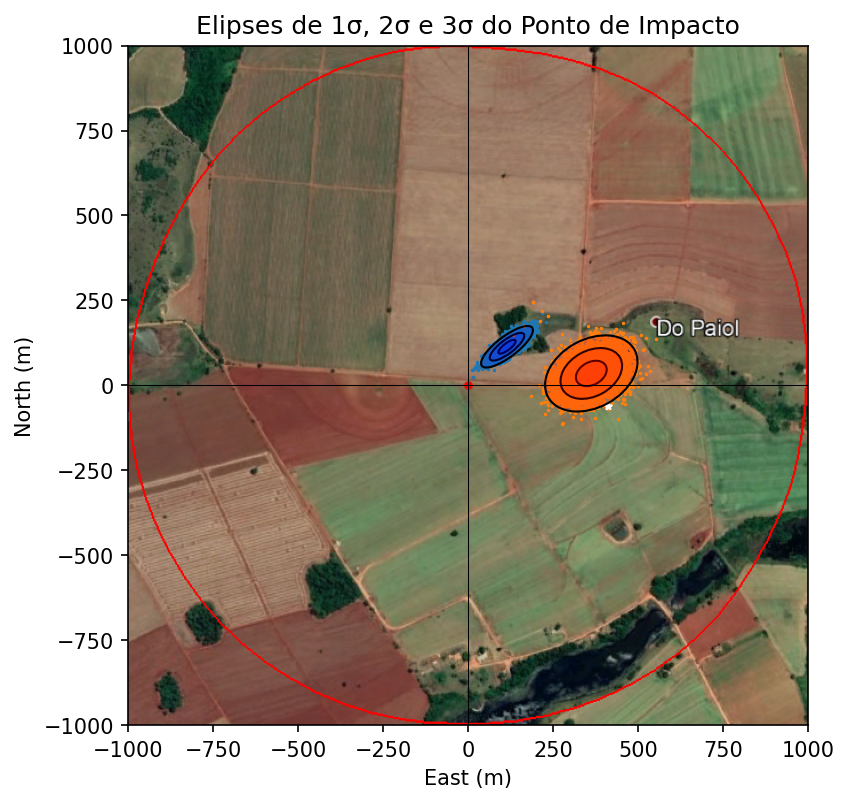

In [163]:
#@title
# Import libraries
from imageio import imread
from matplotlib.patches import Ellipse
from imageio import imread
import matplotlib as mpl
import matplotlib.pyplot as plt

# Import background map
img = imread("../../data/valetudo/valetudo_basemap.png")

# Retrieve dispersion data por apogee and impact XY position
apogeeX = np.array(dispersion_results['apogeeX'])
apogeeY = np.array(dispersion_results['apogeeY'])
impactX = np.array(dispersion_results['impactX'])
impactY = np.array(dispersion_results['impactY'])

# Define function to calculate eigen values
def eigsorted(cov):
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    return vals[order], vecs[:,order]
  
# Create plot figure
plt.figure(num=None, figsize=(8, 6), dpi=150, facecolor='w', edgecolor='k')
ax = plt.subplot(111)

# Calculate error ellipses for impact
impactCov = np.cov(impactX, impactY)
impactVals, impactVecs = eigsorted(impactCov)
impactTheta = np.degrees(np.arctan2(*impactVecs[:,0][::-1]))
impactW, impactH = 2 * np.sqrt(impactVals)

# Draw error ellipses for impact
impact_ellipses = []
for j in [1, 2, 3]:
    impactEll = Ellipse(xy=(np.mean(impactX), np.mean(impactY)),
                  width=impactW*j, height=impactH*j,
                  angle=impactTheta, color='black')
    impactEll.set_facecolor((1, 0, 0, 0.2))
    impact_ellipses.append(impactEll)
    ax.add_artist(impactEll)

# Calculate error ellipses for apogee
apogeeCov = np.cov(apogeeX, apogeeY)
apogeeVals, apogeeVecs = eigsorted(apogeeCov)
apogeeTheta = np.degrees(np.arctan2(*apogeeVecs[:,0][::-1]))
apogeeW, apogeeH = 2 * np.sqrt(apogeeVals)

# Draw error ellipses for apogee
for j in [1, 2, 3]:
    apogeeEll = Ellipse(xy=(np.mean(apogeeX), np.mean(apogeeY)),
                  width=apogeeW*j, height=apogeeH*j,
                  angle=apogeeTheta, color='black')
    apogeeEll.set_facecolor((0, 0, 1, 0.2))
    ax.add_artist(apogeeEll)
    

# Draw apogee points
plt.scatter(apogeeX, apogeeY, s=0.5)
    
# Draw impact points
plt.scatter(impactX, impactY, s=0.5)

# Draw launch point
plt.scatter(0, 0, s=10, color='red')

# Add title and labels to plot
ax.set_title('Elipses de 1σ, 2σ e 3σ do Ponto de Impacto')
ax.set_ylabel('North (m)')
ax.set_xlabel('East (m)')

# Add background image to plot
dx = 0
dy = 0
plt.imshow(img,zorder=0, extent=[-1000-dx, 1000-dx, -1000-dy, 1000-dy])
plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)

# Add real landing point
plt.scatter( 411.89, -61.07, s=10, color='white', marker='*')

# Calculate probability of rocket being out of 3-sigma error ellipse for impact
cos_angle = np.cos(np.radians(180.-impactTheta))
sin_angle = np.sin(np.radians(180.-impactTheta))

xc = impactX - np.mean(impactX)
yc = impactY - np.mean(impactY)

xct = xc * cos_angle - yc * sin_angle
yct = xc * sin_angle + yc * cos_angle 

n=3
rad_cc = (xct**2/(n*impactW/2.)**2) + (yct**2/(n*impactH/2.)**2)

colors_array = []
count = 0

for r in rad_cc:
    if r <= 1.:
        # point in ellipse
        colors_array.append('red')
        count+=1
    else:
        # point not in ellipse
        colors_array.append('blue')
        
print("Probability of Impact out of Error Ellipses: " + "{:.3f}".format(100 - 100*count/len(impactX)) + " %")
plt.savefig (str(filename)+ '.png')
plt.show()